# Ecuación 1D de Burgers

En el caso de la convección no lineal se estudió la ecuación invísida de Burgers, sin embargo la ecuación de Burgers junta dos fenómenos ya estudiados, la convección no lineal y la difussión, ésta última siendo análoga a un caso con viscosidad. La ecuación de Burgers es

$$\frac{\partial u}{\partial t} + u\frac{\partial u}{\partial x} = \nu \frac{\partial^2 u}{\partial x^2}$$


Discretizando la ecuación tenemos
$$\frac{u_i^{n+1}-u_i^n}{\Delta t} + u_i^n \frac{u_i^n-u_{i-1}^n}{\Delta x} = \nu \frac{u_{i+1}^n+u_{i-1}^n-2u_i^n}{\left(\Delta x\right)^2} $$
De donde

$$u_i^{n+1}=u_i^n -u_i^n \frac{\Delta t}{\Delta x}\left(u_i^n-u_{i-1}^n\right) +\nu \frac{ \Delta t}{\left(\Delta x\right)^2} \left(u_{i+1}^n+u_{i-1}^n-2u_i^n \right)$$

Se encuentra en la literatura que hay una solución analítica de la ecuación de Burgers para el caso en las condiciones iniciales son

$$u(x,0) = -\frac{2\nu}{\phi}\frac{\partial \phi}{\partial x} +4$$
$$\phi(x) = \exp\left(-\frac{x^2}{4\nu}\right) + \exp\left(-\frac{(x-2\pi)^2}{4\nu}  \right)$$
Con condiciones de frontera periodicas, $\textit{i.e.}$ $u(0,t)=u(2\pi,t)$

La solución analítica $u(x,t)$ es

$$u(x,t) = -\frac{2\nu}{\phi}\frac{\partial \phi}{\partial x} +4$$
$$\phi(x,t) = \exp\left(-\frac{(x-4t)^2}{4\nu(t+1)}\right) + \exp\left(-\frac{(x-4t-2\pi)^2}{4\nu(t+1)}  \right)$$

Para evitar hacer $\frac{\partial \phi}{\partial x}$ se va a utilizar la librería Sympy, que calcula simbolicamente la parcial.

In [2]:
#Se importan las librerias de numpy, sympy y para graficar matplotlib
from numpy import *
import sympy
from matplotlib.pyplot import *
from matplotlib import animation
from JSAnimation import IPython_display
%matplotlib inline

## Implementación de las condiciones iniciales

Para que las funciones de Sympy puedan tener como formato de salida una formula escrita en $\LaTeX$ se necesita ejecutar el siguiente bloque.

In [3]:
from sympy import init_printing
init_printing(use_latex=True)

In [4]:
#Se introduce en sympy los simbolos que va usar
x, nu, t = sympy.symbols('x nu t')
#Se declara la funcion que queremos que sympy escriba
phi = sympy.exp(-(x-4*t)**2/(4*nu*(t+1))) + sympy.exp(-(x-4*t-2*sympy.pi)**2/(4*nu*(t+1)))
phi

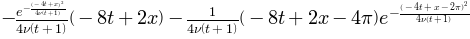

In [5]:
#Calculemos ahora la derivada parcial de phi respecto del espacio
phiprime = phi.diff(x)
phiprime

Ya que tenemos una for de la derivada de $\phi$ debemos empezar a escribir la condición inicial de la u y poder utilizarla como argumento de funciones de Python. Para esto existe la funcion *lambdify* que transforma una función simbolica como la que tenemos y la transforma en una formula que se puede evaluar.

In [6]:
from sympy.utilities.lambdify import lambdify

#Se define nuestra condicion inicial
u = -2*nu*(phiprime/phi)+4
print(u)

#Se tansforma la funcion u en una funcion que se puede evaluar
#primero se introduce en la funcion lambdify las variables de las cuales depende la funcion
#y segundo la funcion simbolica
ufunc = sympy.lambdify((t, x, nu), u)
    
#Evaluamos en un punto del espacio t, x, nu
print(ufunc(1,4,3))

-2*nu*(-(-8*t + 2*x)*exp(-(-4*t + x)**2/(4*nu*(t + 1)))/(4*nu*(t + 1)) - (-8*t + 2*x - 4*pi)*exp(-(-4*t + x - 2*pi)**2/(4*nu*(t + 1)))/(4*nu*(t + 1)))/(exp(-(-4*t + x - 2*pi)**2/(4*nu*(t + 1))) + exp(-(-4*t + x)**2/(4*nu*(t + 1)))) + 4
3.49170664206


In [7]:
#Se definen las variables
nx = 101
nt = 100
dx = 2.*pi/(nx-1)
nu = 0.07
#Se utiliza la condicion CFL
dt = dx*nu

x = linspace(0., 2.*pi, nx)
un = empty(nx)
t = 0

#Se asigna a u la evaluacion de la funcion ufunc que es la condicion inicial para los puntos de la malla espacial
u = asarray([ufunc(t, x0, nu) for x0 in x])

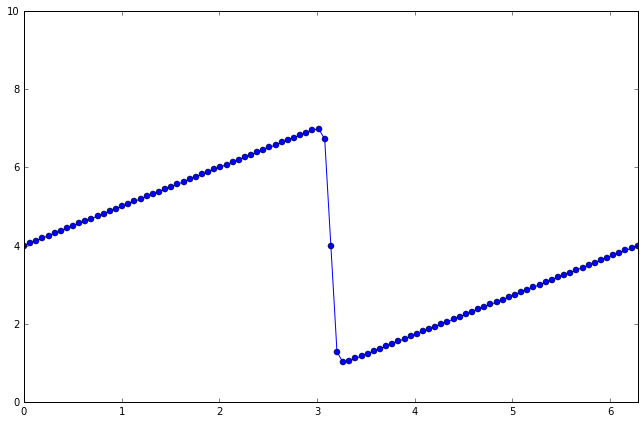

In [8]:
figure(figsize=(11,7), dpi=100)
plot(x, u, marker='o',color='b', label=u'Condición inicial de la ecuación de Burgers')
xlim([0,2*pi])
ylim([0,10]);

## Implementación de las condiciones de frontera y el método de discretización

De la discretizando la ecuación tenemos
$$u_i^{n+1}=u_i^n -u_i^n \frac{\Delta t}{\Delta x}\left(u_i^n-u_{i-1}^n\right) +\nu \frac{ \Delta t}{\left(\Delta x\right)^2} \left(u_{i+1}^n+u_{i-1}^n-2u_i^n \right)$$

La condición de frontera que sea periodica, $u(x,t)=u(x+2\pi,t)$ impone condiciones sobre como debemos de calcular el siguiente paso en el tiempo de la fucnión en los extremos, $\textit{i.e.}$ en $x=0$ y en $x=2\pi$, claro está que debemos de calcular en el inicio y final de nuestra malla espacial.

In [9]:
def avance_en_tiempo(u0, nx, nt, dx, nu, sigma, flag=False):
    #Se utiliza la condicion CFL
    dt = sigma*dx*nu
    u = u0
    if flag: hist=[]
    for n in range(nt):
        un = u.copy()
        if flag: hist.append(un)
        for i in range(1, nx-1):
            u[i] = un[i] - un[i] * dt/dx *(un[i] - un[i-1]) + (nu*dt/dx**2)*(un[i+1]-2*un[i]+un[i-1])

        u[0] = un[0] - un[0] * (dt/dx) * (un[0] - un[-1]) + (nu*dt/dx**2)*(un[1]-2*un[0]+un[-1])
        u[-1] = un[-1] - un[-1] * (dt/dx) * (un[-1] - un[-2]) + (nu*dt/dx**2)*(un[0]-2*un[-1]+un[-2])
    
    if flag:
        return hist
    else:
        return u

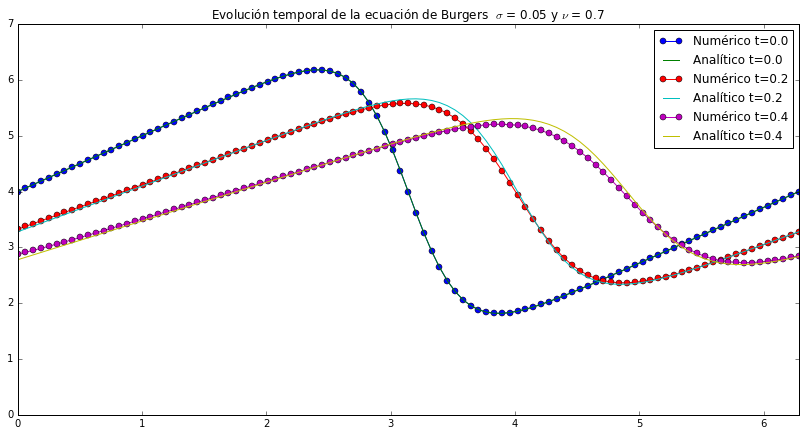

In [10]:
#Se definen las variables
nx = 101
nt = 100
dx = 2.*pi/(nx-1)
nu = 0.7
sigma=0.05

x = linspace(0., 2.*pi, nx)
t = 0

figure(figsize=(14,7), dpi=100)
for nt in range(0, 300, 100):
    dt = sigma*dx*nu
    u0 = asarray([ufunc(t, x0, nu) for x0 in x])
    
    u = avance_en_tiempo(u0, nx, nt, dx, nu, sigma)
    
    u_analytical = asarray([ufunc(nt*dt, xi, nu) for xi in x])
    
    plot(x, u, marker='o', label=u'Numérico t='+str(trunc(10*nt*dt)/10))
    plot(x, u_analytical, label=u'Analítico t='+str(trunc(10*nt*dt)/10))
    title(u'Evolución temporal de la ecuación de Burgers  $\sigma$ = '+str(sigma)+' y $\\nu$ = '+str(nu))
    xlim([0,2*pi])
    ylim([0,7])
    legend()


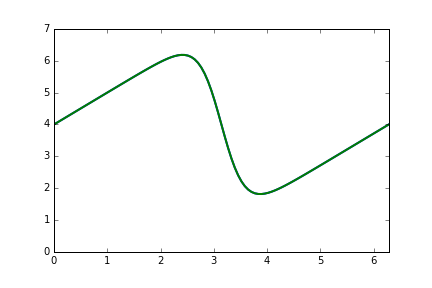
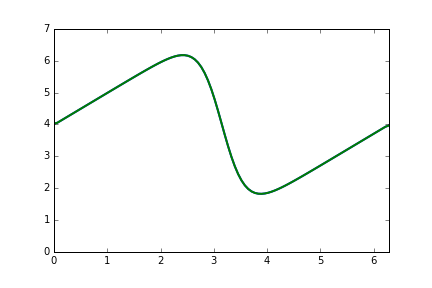
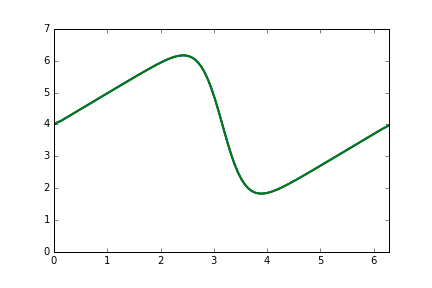
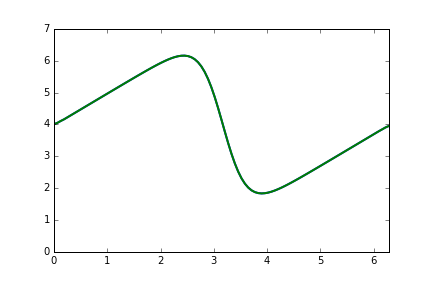
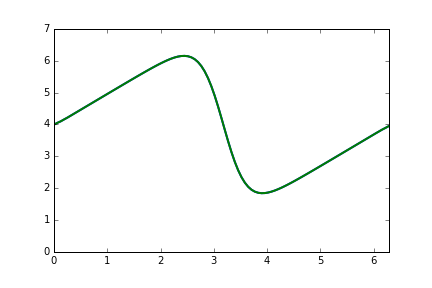
...
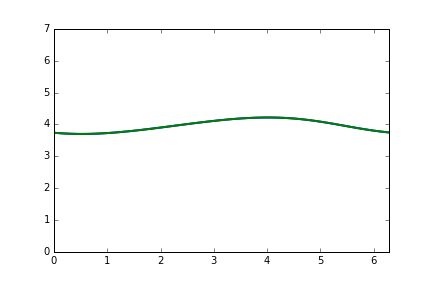
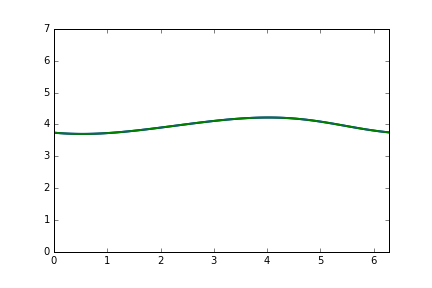
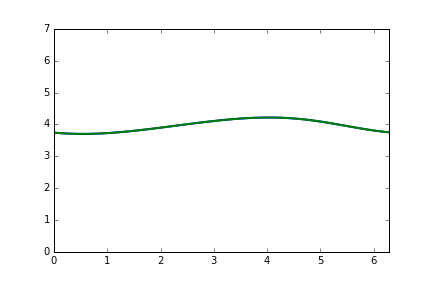
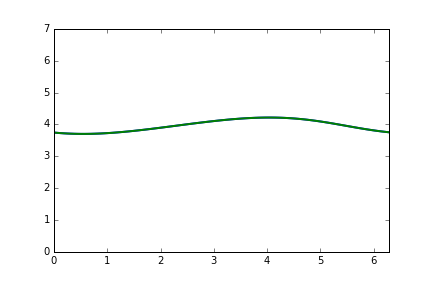
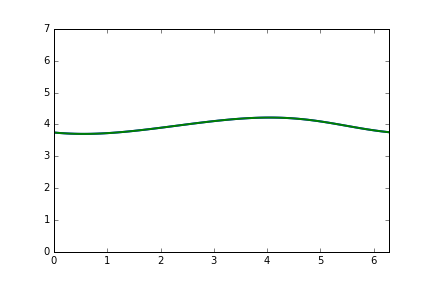

In [18]:
#Se definen las variables
nx = 101
nt = 100
dx = 2.*pi/(nx-1)
nu = 0.7
sigma=0.05

x = linspace(0., 2.*pi, nx)
t = 0

dt = sigma*dx*nu
u0 = asarray([ufunc(t, x0, nu) for x0 in x])
    
u_sol = avance_en_tiempo(u0, nx, 1000, dx, nu, sigma, True)

# Se define el ambiente en el que queremos hacer la animación
fig = figure()
ax = axes(xlim=(0, 2*pi), ylim=(0., 7.))
linea1, = ax.plot([], [], lw=2)
linea2, = ax.plot([], [], lw=2)
T = 500 # periodo para generar T cuadros

# Funcion para inicializar cada cuadro de la animacion
def init():
    linea1.set_data([], [])
    linea2.set_data([], [])
    return linea1,linea2

# Esta funcion se llama de manera secuencial para cada elemento i.
def animate(i):
    x = linspace(0, 2*pi, nx)
    y1 = u_sol[i]
    y2 = u_sol[i]
    linea1.set_data(x, y1),linea2.set_data(x, y2),
    return linea1,linea2,

# Se llama a la animacion.  blit=True es para que solo se dibije las partes de la imagen que tienen cambios.
animation.FuncAnimation(fig, animate, init_func=init, frames=2*T, interval=20, blit=True)

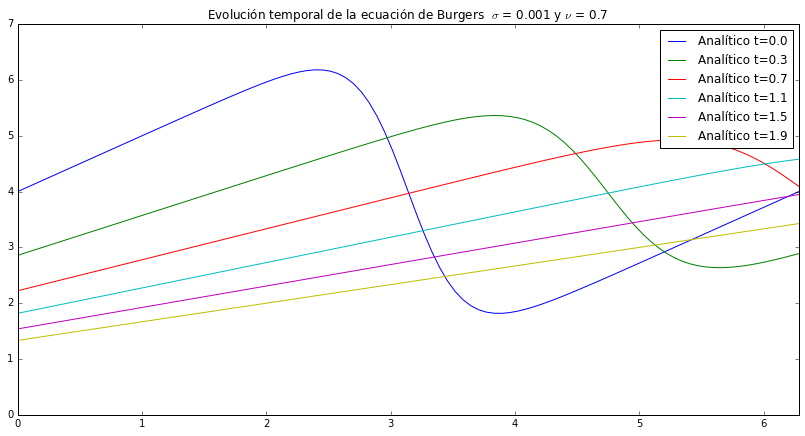

In [11]:
#Se definen las variables
nx = 101
nt = 100
dx = 2.*pi/(nx-1)
nu = 0.7
sigma=0.001

x = linspace(0., 2.*pi, nx)
t = 0
dt = sigma*dx*nu

figure(figsize=(14,7), dpi=100)
for nt in range(0, int(2./dt),  int(0.4/dt)):
    u_analytical = asarray([ufunc(nt*dt, xi, nu) for xi in x])
    plot(x, u_analytical, label=u'Analítico t='+str(trunc(10*nt*dt)/10))
    title(u'Evolución temporal de la ecuación de Burgers  $\sigma$ = '+str(sigma)+' y $\\nu$ = '+str(nu))
    xlim([0,2*pi])
    ylim([0,7])
    legend()

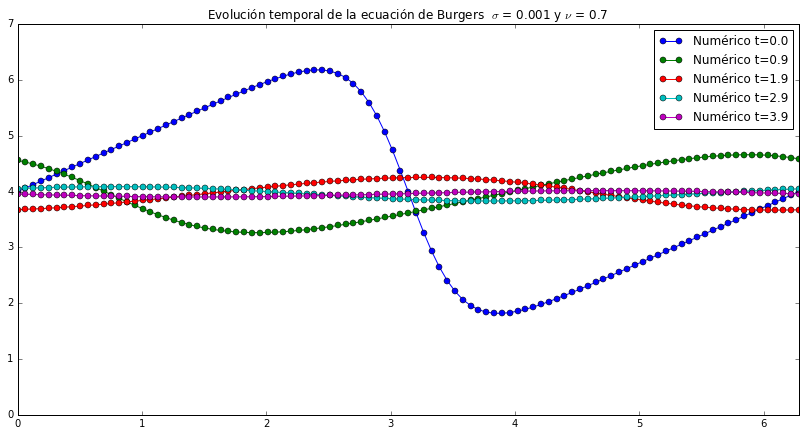

In [12]:
#Se definen las variables
nx = 101
nt = 100
dx = 2.*pi/(nx-1)
nu = 0.7
sigma=0.001

x = linspace(0., 2.*pi, nx)
t = 0
dt = sigma*dx*nu

figure(figsize=(14,7), dpi=100)
for nt in range(0, int(4./dt),  int(1./dt)):

    u0 = asarray([ufunc(t, x0, nu) for x0 in x])
    u = avance_en_tiempo(u0, nx, nt, dx, nu, sigma)

    plot(x, u, marker='o', label=u'Numérico t='+str(trunc(10*nt*dt)/10))
    title(u'Evolución temporal de la ecuación de Burgers  $\sigma$ = '+str(sigma)+' y $\\nu$ = '+str(nu))
    xlim([0, 2*pi])
    ylim([0,7])
    legend()